<a href="https://colab.research.google.com/github/sergioGarcia91/ML_and_EDA/blob/main/04c_PlugsMesa_PCA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Principal Component Analysis (PCA) - Dataset: Plugs Mesa de Los Santos

> *Ser tan rápidos como el más lento, \
> y ser tan lentos como el más rápido.*

**Autor:** Sergio Andrés García Arias  
**Versión 01:** Julio 2024


# Introducción

En este Notebook exploraremos el uso del algoritmo de `Análisis de Componentes Principales` (Principal Component Analysis - PCA). PCA es una técnica de reducción de dimensionalidad, permitiendo simplificar la complejidad de los datos, conservando la mayor variabilidad o varianza de los datos.

> **Observación:** En este Notebook hemos optado por omitir la realización del Análisis Exploratorio de Datos (EDA). Se recomienda llevar a cabo el EDA antes de aplicar PCA para obtener una visión más completa del conjunto de datos.

## ¿Cómo funciona?
El Análisis de Componentes Principales transforma un conjunto de observaciones, para nuestro caso muestras con diferentes mediciones o inforamcion de diferentes propiedades. Cada una de estas propiedaes o mediciones lo podríamos ocnsiderar como un eje, graficar muchos ejes es algo complicado y podría perderse la facilicada de comprencion. Con PCA se busca reducir estos ejes, obteniendo nuevosm identificadno las direcciones de mayor varianza en los datos y las utiliza para proyectar los datos en un espacio de menor dimensión o menor cantidad de ejes.

El resultado es un conjunto de datos transformados que mantiene las características más importantes del conjunto original en un espacio reducido, facilitando su análisis y visualización.

<center>
<img src='https://upload.wikimedia.org/wikipedia/commons/thumb/f/f5/GaussianScatterPCA.svg/800px-GaussianScatterPCA.svg.png' width=500 />

PCA of a multivariate Gaussian distribution centered at (1,3) with a standard deviation of 3 in roughly the (0.866, 0.5) direction and of 1 in the orthogonal direction. The vectors shown are the eigenvectors of the covariance matrix scaled by the square root of the corresponding eigenvalue, and shifted so their tails are at the mean. *Fuente: [Wikipedia](https://en.wikipedia.org/wiki/Principal_component_analysis)*
</center>



# Inicio

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors #para escala logaritmica el colorbar
import seaborn as sn

from matplotlib.lines import Line2D # para la leyenda
from sklearn.decomposition import PCA # para calcular PCA
from sklearn.preprocessing import StandardScaler # escalar a media 0 std 1

# Cargar CSV

In [2]:
url = 'https://raw.githubusercontent.com/sergioGarcia91/ML_and_EDA/main/Datasets/PlugsMesaLosSantos_2022.csv'
# CSV de los datos Plugs
df = pd.read_csv(url, sep=';', decimal='.')

df.head()

,Muestra,Estacion,MuestraNew,X,Y,Z,Formacion Geologica,Unidad,Litologia,Abreviacion,...,M Dry [mV/V],M Wet [mV/V],Vp [m/s],Peak Load [kN],Is50 [MPa],LF [SI],HF [SI],FD [%],Distancia Falla [m],Unnamed: 25
0,Ls5-12,LSN-01,LSN-01,1114949.39,1246238.02,1745.0,Fm. Los Santos,K1ls_ms,arenisca,Ar,...,8.65,22.49,1059.0,1.32,0.41,0.000015,0.000024,-61.45,1579.23,NaN
1,Ls5-13a,LSN-02,LSN-02a,1115819.32,1247030.08,1761.0,Fm. Los Santos,K1ls_ms,arenisca,Ar,...,9.65,21.16,1294.0,1.82,0.61,0.000008,0.000003,59.76,577.10,NaN
2,Ls5-13b,LSN-02,LSN-02b,1115819.32,1247030.08,1761.0,Fm. Los Santos,K1ls_ms,arenisca,Ar,...,9.83,14.52,2550.0,0.52,0.33,0.000021,0.000032,-49.71,577.10,NaN
3,Ls6-01,LSN-03,LSN-03,1115324.37,1256812.13,1677.0,Fm. Los Santos,K1ls_ms,arenisca,Ar,...,47.46,7.52,3297.0,0.72,0.24,0.000003,0.000002,50.98,21.24,NaN
4,Ls6-02,LSN-04,LSN-04,1115076.27,1257212.30,1608.0,Fm. Los Santos,K1ls_ms,arenisca,Ar,...,9.74,33.65,2175.0,0.42,0.13,0.000021,0.000036,-69.97,211.66,NaN


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 358 entries, 0 to 357
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Muestra              358 non-null    object 
 1   Estacion             358 non-null    object 
 2   MuestraNew           358 non-null    object 
 3   X                    358 non-null    float64
 4   Y                    358 non-null    float64
 5   Z                    358 non-null    float64
 6   Formacion Geologica  358 non-null    object 
 7   Unidad               358 non-null    object 
 8   Litologia            358 non-null    object 
 9   Abreviacion          358 non-null    object 
 10  Uni-Lito             358 non-null    object 
 11  Agua [%]             358 non-null    float64
 12  Porosidad [%]        358 non-null    float64
 13  Densidad [gr/cm3]    358 non-null    float64
 14  Rho Dry [Ohm*m]      358 non-null    float64
 15  Rho Wet [Ohm*m]      358 non-null    flo

In [4]:
df.describe()

,X,Y,Z,Agua [%],Porosidad [%],Densidad [gr/cm3],Rho Dry [Ohm*m],Rho Wet [Ohm*m],M Dry [mV/V],M Wet [mV/V],Vp [m/s],Peak Load [kN],Is50 [MPa],LF [SI],HF [SI],FD [%],Distancia Falla [m],Unnamed: 25
count,3.580000e+02,3.580000e+02,358.000000,358.000000,358.000000,358.000000,3.580000e+02,358.000000,358.000000,358.000000,358.000000,358.000000,358.000000,3.580000e+02,3.580000e+02,358.000000,358.000000,0.0
mean,1.107876e+06,1.247329e+06,1353.933240,4.247737,4.847765,2.583883,1.757044e+05,1905.931363,11.153176,8.893592,2898.303324,4.373855,2.728965,4.707883e-04,4.661441e-04,12.943966,383.452793,NaN
std,5.167245e+03,6.687660e+03,228.391492,4.106131,5.315445,0.172947,4.335992e+05,3592.936510,15.064093,4.885653,1380.659247,3.764978,2.117483,3.198145e-03,3.218863e-03,38.342903,316.737887,NaN
min,1.098422e+06,1.237639e+06,719.000000,0.080000,0.000000,1.770000,2.105000e+01,26.880000,1.630000,1.930000,735.000000,0.020000,0.010000,2.200000e-08,1.880000e-08,-97.940000,0.020000,NaN
25%,1.103871e+06,1.242119e+06,1203.000000,1.725000,0.832500,2.540000,4.581217e+03,337.860000,4.335000,5.152500,1757.750000,1.520000,1.152500,7.402500e-06,5.042500e-06,-1.250000,149.640000,NaN
50%,1.107508e+06,1.245813e+06,1343.000000,3.275000,3.250000,2.620000,2.374373e+04,762.950000,7.615000,7.850000,2803.500000,3.660000,2.260000,3.885000e-05,3.200000e-05,9.770000,306.190000,NaN
75%,1.112396e+06,1.252772e+06,1546.000000,5.342500,7.217500,2.650000,1.347002e+05,1869.975000,12.325000,11.920000,3949.750000,6.220000,3.777500,1.577500e-04,1.410000e-04,33.815000,526.820000,NaN
max,1.117932e+06,1.259983e+06,1761.000000,29.590000,32.930000,3.360000,4.680624e+06,37015.690000,185.440000,33.650000,5995.000000,24.520000,10.780000,4.080000e-02,4.100000e-02,94.800000,1628.540000,NaN


# Preparación Previa

Dado que las muestras corresponden a diferentes litologías y formaciones, primero las visualizaremos considerando dos pares de propiedades para evaluar si es posible diferenciarlas entre sí.

Para simplificar el análisis, seleccionaremos solo algunas columnas de interés y obtendremos una copia de los datos para evitar alterar los originales. Además, generaremos algunas columnas nuevas para facilitar la visualización.


In [5]:
df.columns

Index(['Muestra', 'Estacion', 'MuestraNew', 'X', 'Y', 'Z',
       'Formacion Geologica', 'Unidad', 'Litologia', 'Abreviacion', 'Uni-Lito',
       'Agua [%]', 'Porosidad [%]', 'Densidad [gr/cm3]', 'Rho Dry [Ohm*m]',
       'Rho Wet [Ohm*m]', 'M Dry [mV/V]', 'M Wet [mV/V]', 'Vp [m/s]',
       'Peak Load [kN]', 'Is50 [MPa]', 'LF [SI]', 'HF [SI]', 'FD [%]',
       'Distancia Falla [m]', 'Unnamed: 25'],
      dtype='object')

In [6]:
plugs = df[['Muestra', 'Unidad', 'Litologia', 'Porosidad [%]',
            'Densidad [gr/cm3]', 'Rho Wet [Ohm*m]', 'M Wet [mV/V]',
            'Vp [m/s]', 'Is50 [MPa]', 'LF [SI]', 'HF [SI]']].copy()
plugs.head()

,Muestra,Unidad,Litologia,Porosidad [%],Densidad [gr/cm3],Rho Wet [Ohm*m],M Wet [mV/V],Vp [m/s],Is50 [MPa],LF [SI],HF [SI]
0,Ls5-12,K1ls_ms,arenisca,10.98,2.66,916.49,22.49,1059.0,0.41,0.000015,0.000024
1,Ls5-13a,K1ls_ms,arenisca,9.89,2.65,816.88,21.16,1294.0,0.61,0.000008,0.000003
2,Ls5-13b,K1ls_ms,arenisca,7.84,2.61,315.44,14.52,2550.0,0.33,0.000021,0.000032
3,Ls6-01,K1ls_ms,arenisca,7.24,2.64,497.95,7.52,3297.0,0.24,0.000003,0.000002
4,Ls6-02,K1ls_ms,arenisca,20.17,2.76,662.24,33.65,2175.0,0.13,0.000021,0.000036


In [7]:
plugs.head()

,Muestra,Unidad,Litologia,Porosidad [%],Densidad [gr/cm3],Rho Wet [Ohm*m],M Wet [mV/V],Vp [m/s],Is50 [MPa],LF [SI],HF [SI]
0,Ls5-12,K1ls_ms,arenisca,10.98,2.66,916.49,22.49,1059.0,0.41,0.000015,0.000024
1,Ls5-13a,K1ls_ms,arenisca,9.89,2.65,816.88,21.16,1294.0,0.61,0.000008,0.000003
2,Ls5-13b,K1ls_ms,arenisca,7.84,2.61,315.44,14.52,2550.0,0.33,0.000021,0.000032
3,Ls6-01,K1ls_ms,arenisca,7.24,2.64,497.95,7.52,3297.0,0.24,0.000003,0.000002
4,Ls6-02,K1ls_ms,arenisca,20.17,2.76,662.24,33.65,2175.0,0.13,0.000021,0.000036


## Parametros de las graficas

In [8]:
#límites de las Graficas
lim_Porosidad = (-1, 35)
lim_Densidad = (1.65, 3.45)
lim_RhoWet = (10**0, 10**7)
lim_MWet = (10**0, 10**3)
lim_Vp = (0, 7000)
lim_Is50 = (-1, 12)
lim_LF = (0, 1e-1)
lim_HF = (0, 1e-1)


#propiedaes a graficar
propiedadesPlugs = ['Porosidad [%]',
                    'Densidad [gr/cm3]',
                    'Rho Wet [Ohm*m]',
                    'M Wet [mV/V]',
                    'Vp [m/s]',
                    'Is50 [MPa]',
                    'LF [SI]',
                    'HF [SI]']

diccioPropiedades = {'Agua [%]': 'agua',
                    'Porosidad [%]': 'porosidad',
                    'Densidad [gr/cm3]': 'densidad',
                    'Rho Wet [Ohm*m]': 'rhoWet',
                    'M Wet [mV/V]': 'mWet',
                    'Vp [m/s]': 'vp',
                    'Is50 [MPa]': 'is50',
                    'LF [SI]':'lf',
                    'HF [SI]': 'hf'}

#Lista valores únicos
litos_u = plugs['Litologia'].unique() #litologias unicas
unidas_u = plugs['Unidad'].unique() #unidades unicas

#orden boxplots
ordenUnidades = ['Oss', 'J1gp', 'J1-2j', 'K1ls_mi', 'K1ls_mm', 'K1ls_ms', 'K1r', 'K1p', 'K1t']
ordenLitologias = ['esquisto', 'metaarenisca','granito', 'lodolita',
                   'arenisca','conglomerado', 'lodo calcareo',
                   'arenisca calcarea', 'biomicrita', 'caliza']

colores_lito = {'arenisca': 'yellow',
                'lodolita': 'goldenrod',
                'conglomerado': 'orange',
                'lodo calcareo': 'teal',
                'caliza': 'blue',
                'biomicrita': 'cyan',
                'arenisca calcarea': 'springgreen',
                'granito': 'red',
                'metaarenisca': 'green',
                'esquisto': 'lime'}


ordenUniLito = ['Oss [Es]', 'Oss [Ma]', 'J1gp [Gr]',
                'J1-2j [Ld]', 'K1ls_mm [Ld]', 'J1-2j [Ar]', 'K1ls_mi [Ar]',
                'K1ls_ms [Ar]', 'K1r [Ar]', 'J1-2j [Cg]', 'K1ls_mi [Cg]',
                'K1r [Lc]', 'K1p [Lc]', 'K1r [Ac]', 'K1p [Ac]',
                'K1r [Bm]', 'K1p [Bm]', 'K1t [Bm]', 'K1r [Ca]', 'K1p [Ca]']

colores_UniLito = {'Oss [Es]': 'lime',
                   'Oss [Ma]': 'green',
                   'J1gp [Gr]': 'red',
                   'J1-2j [Ld]': 'goldenrod',
                   'K1ls_mm [Ld]': 'goldenrod',
                   'J1-2j [Ar]': 'yellow',
                   'K1ls_mi [Ar]': 'yellow',
                   'K1ls_ms [Ar]': 'yellow',
                   'K1r [Ar]': 'yellow',
                   'J1-2j [Cg]': 'orange',
                   'K1ls_mi [Cg]': 'orange',
                   'K1r [Lc]': 'teal',
                   'K1p [Lc]': 'teal',
                   'K1r [Ac]': 'springgreen',
                   'K1p [Ac]': 'springgreen',
                   'K1r [Bm]': 'cyan',
                   'K1p [Bm]': 'cyan',
                   'K1t [Bm]': 'cyan',
                   'K1r [Ca]': 'blue',
                   'K1p [Ca]': 'blue'}

## Colores y simbolos

In [9]:
#genero color por unidad para los símbolos
colores_unidad = {'Oss':'tab:purple', #silgara
                  'J1gp':'tab:pink', #granito
                  'J1-2j':'tab:cyan', #jordan
                  'K1ls_mi':'tab:green', #santos inf
                  'K1ls_mm':'lime', #santos med
                  'K1ls_ms':'yellow', #santo sup
                  'K1r':'tab:brown', #rosablanca
                  'K1p':'tab:olive', #paja
                  'K1t':'tab:orange'} #tablazo


#genero un simbolo por litologia
simbolo_lito = {'arenisca': 'o',
                'lodolita': 'v',
                'conglomerado': 'X',
                'lodo calcareo': '^',
                'caliza': 'D',
                'biomicrita': 'd',
                'arenisca calcarea': 's',
                'granito': 'P',
                'metaarenisca': '>',
                'esquisto': '<'}

plugs['Color'] = plugs['Unidad'].replace(colores_unidad)
plugs['Simbolo'] = plugs['Litologia'].replace(simbolo_lito)

#Configuracion de la leyenda
simbol_unicos = plugs['Simbolo'].unique() #simbolos unicos a usar

custom_lines = [Line2D([0], [0], color='tab:orange', lw=6),
                Line2D([0], [0], color='tab:olive', lw=6),
                Line2D([0], [0], color='tab:brown', lw=6),
                Line2D([0], [0], color='yellow', lw=6),
                Line2D([0], [0], color='lime', lw=6),
                Line2D([0], [0], color='tab:green', lw=6),
                Line2D([0], [0], color='tab:cyan', lw=6),
                Line2D([0], [0], color='tab:pink', lw=6),
                Line2D([0], [0], color='tab:purple', lw=6)]
labels_unidad = ['K1t', 'K1p', 'K1r', 'K1ls_ms', 'K1ls_mm', 'K1ls_mi', 'J1-2j', 'J1gp','OSs']

custom_simbol = [Line2D([0], [0], marker='o', color='w', markerfacecolor='k', markersize=8),
                Line2D([0], [0], marker='v', color='w', markerfacecolor='k', markersize=8),
                Line2D([0], [0], marker='X', color='w', markerfacecolor='k', markersize=8),
                Line2D([0], [0], marker='^', color='w', markerfacecolor='k', markersize=8),
                Line2D([0], [0], marker='D', color='w', markerfacecolor='k', markersize=8),
                Line2D([0], [0], marker='d', color='w', markerfacecolor='k', markersize=8),
                Line2D([0], [0], marker='s', color='w', markerfacecolor='k', markersize=8),
                Line2D([0], [0], marker='P', color='w', markerfacecolor='k', markersize=8),
                Line2D([0], [0], marker='>', color='w', markerfacecolor='k', markersize=8),
                Line2D([0], [0], marker='<', color='w', markerfacecolor='k', markersize=8)]
labels_simbol = ['arenisca',
                 'lodolita',
                 'conglomerado',
                 'lodo calcareo',
                 'caliza',
                 'biomicrita',
                 'arenisca calcarea',
                 'granito',
                 'metaarenisca',
                 'esquisto']

## Graficos VS

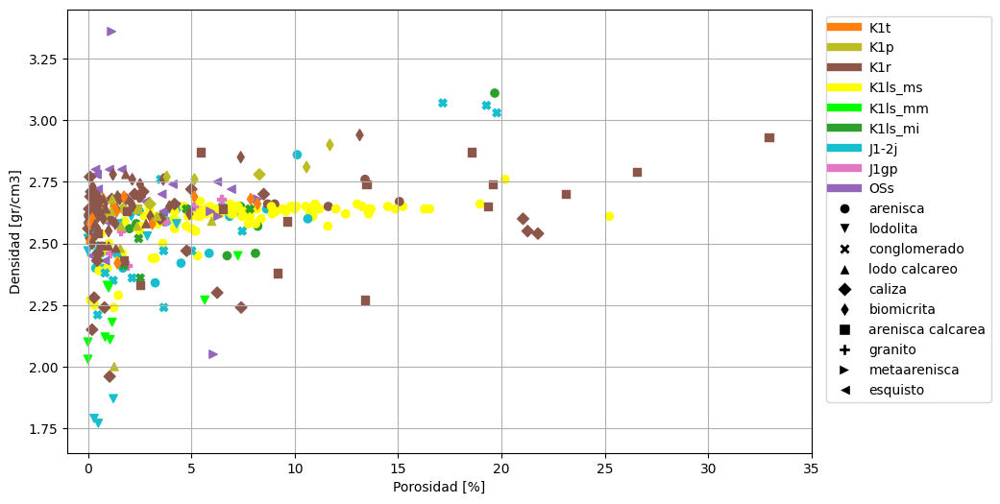

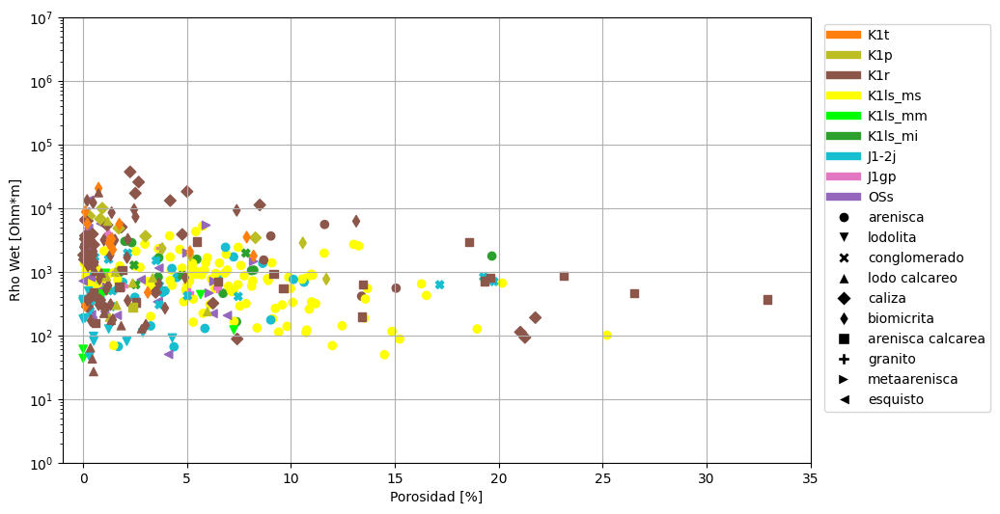

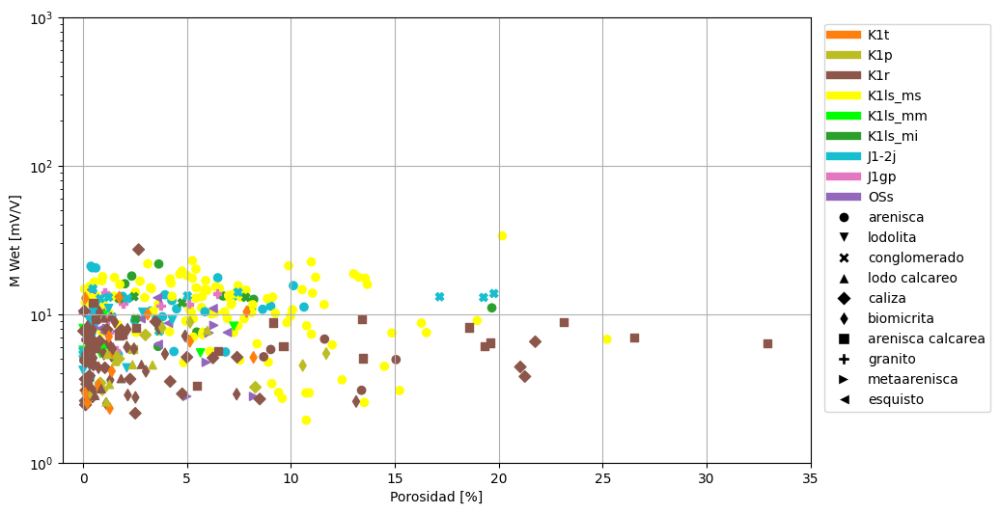

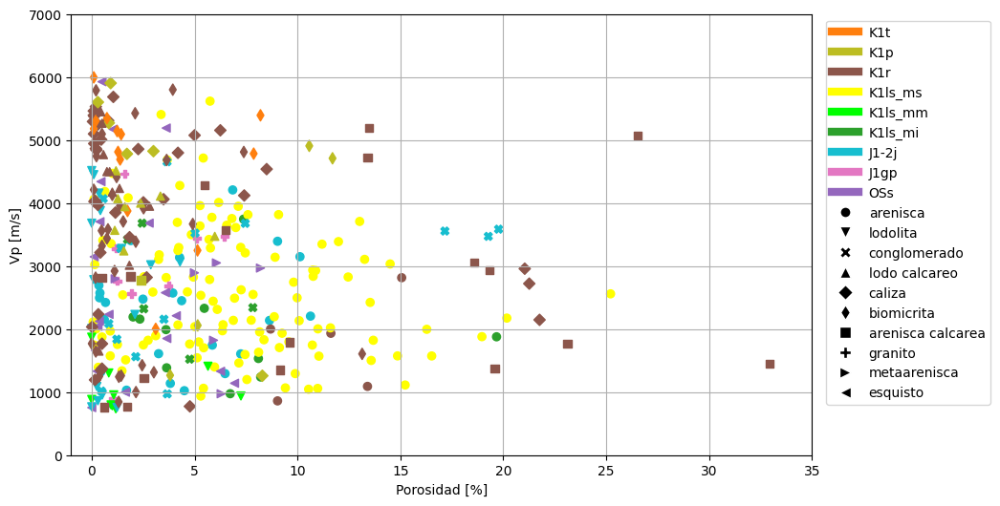

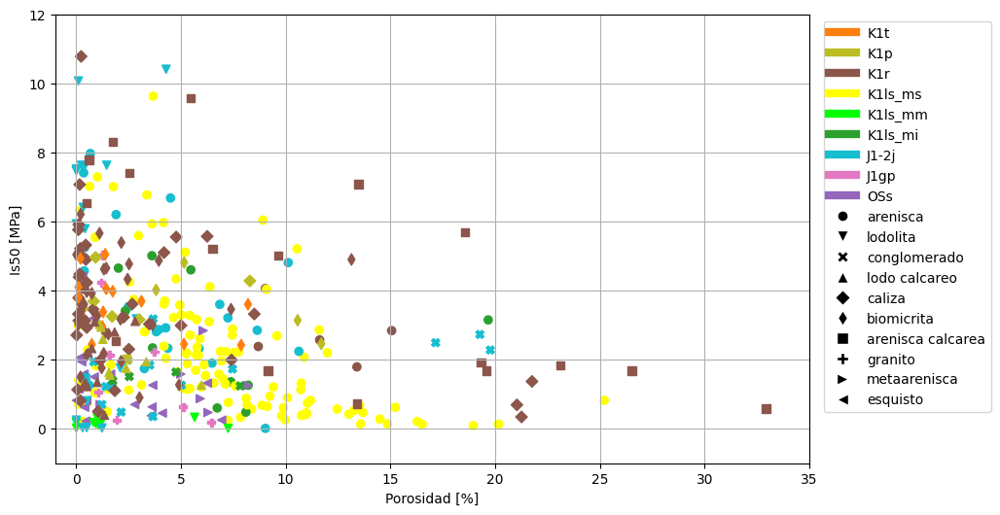

<ipython-input-10-6e6a645ec4df>:27: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  plt.ylim(lim_LF)


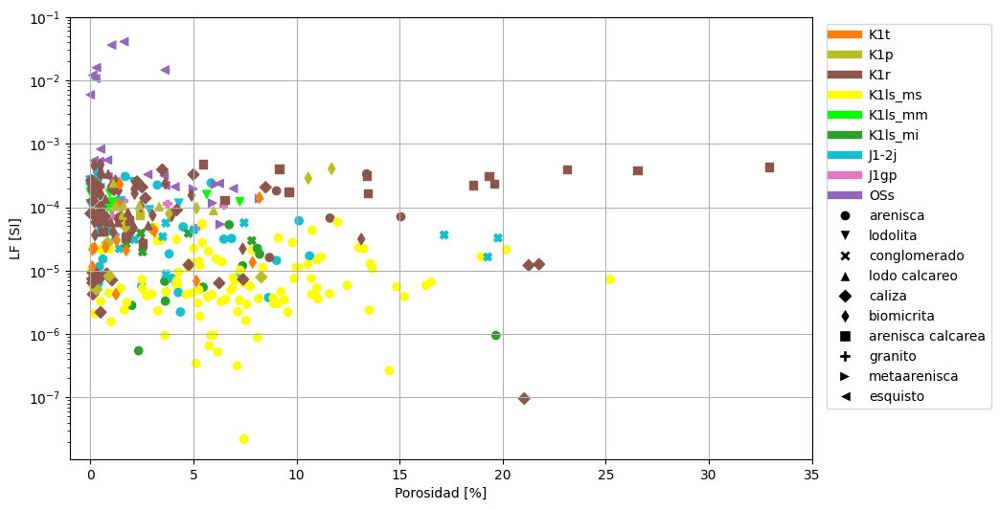

<ipython-input-10-6e6a645ec4df>:30: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  plt.ylim(lim_HF)


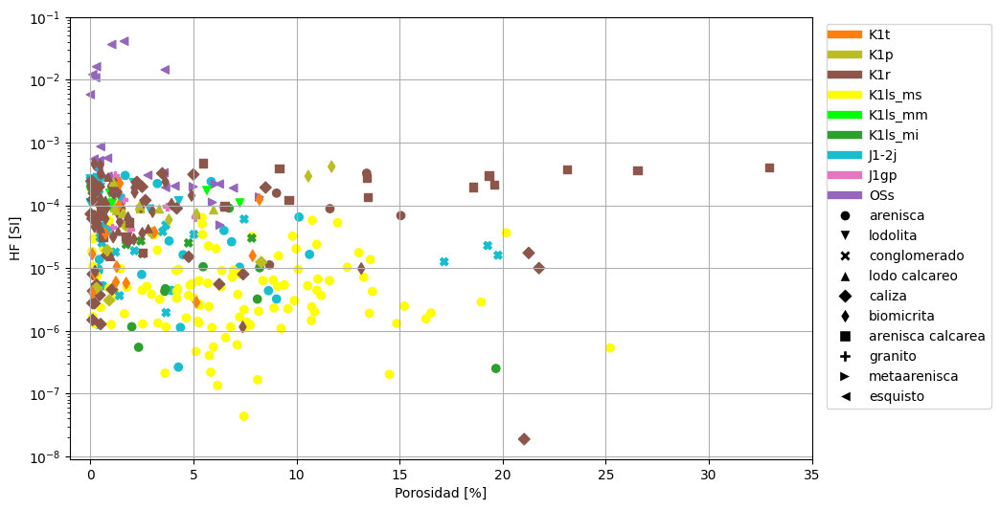

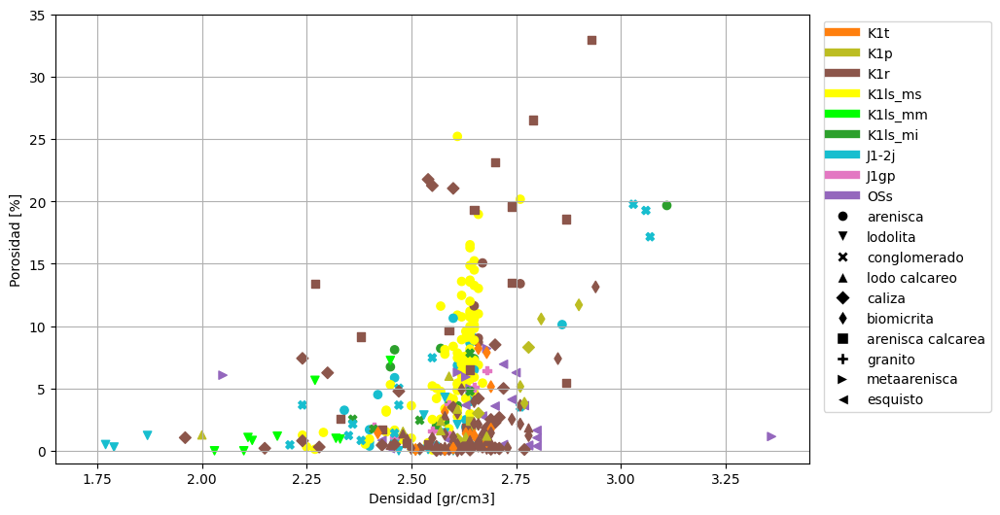

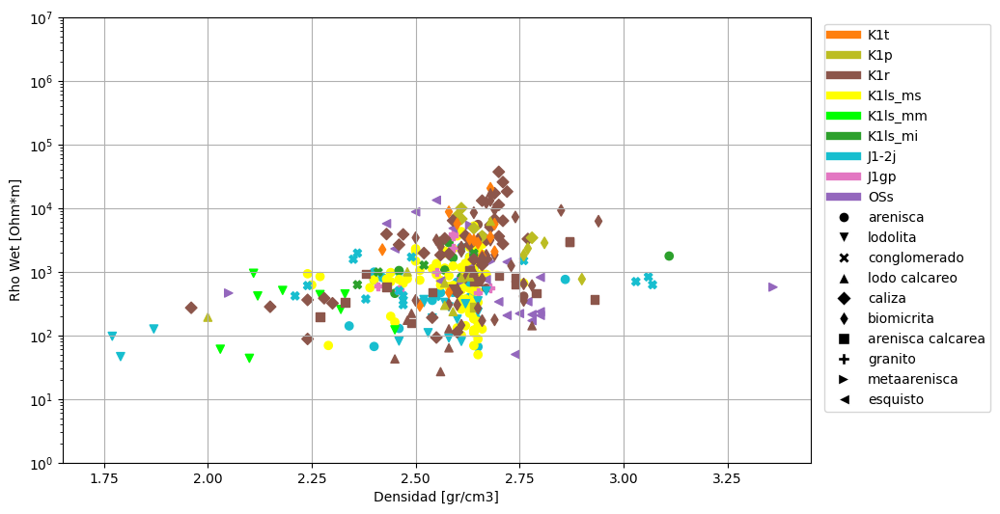

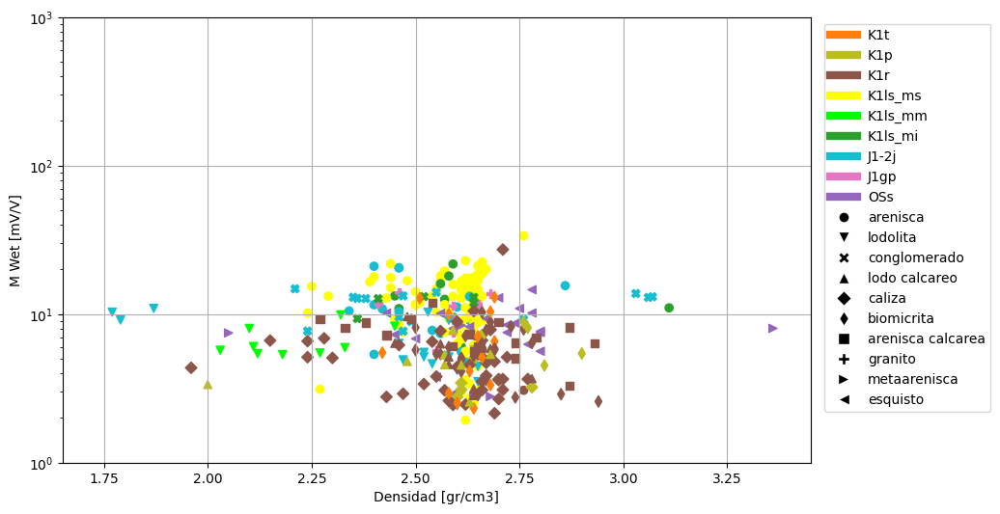

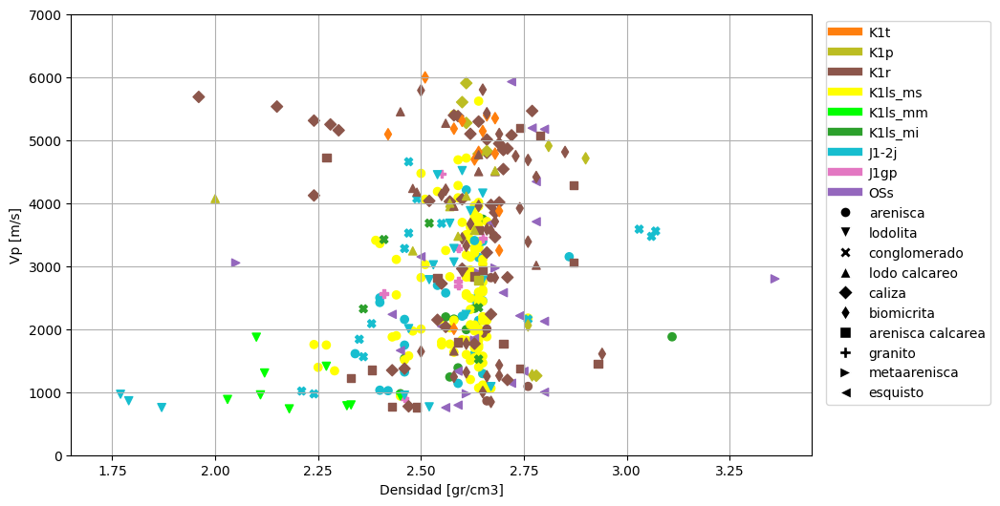

...

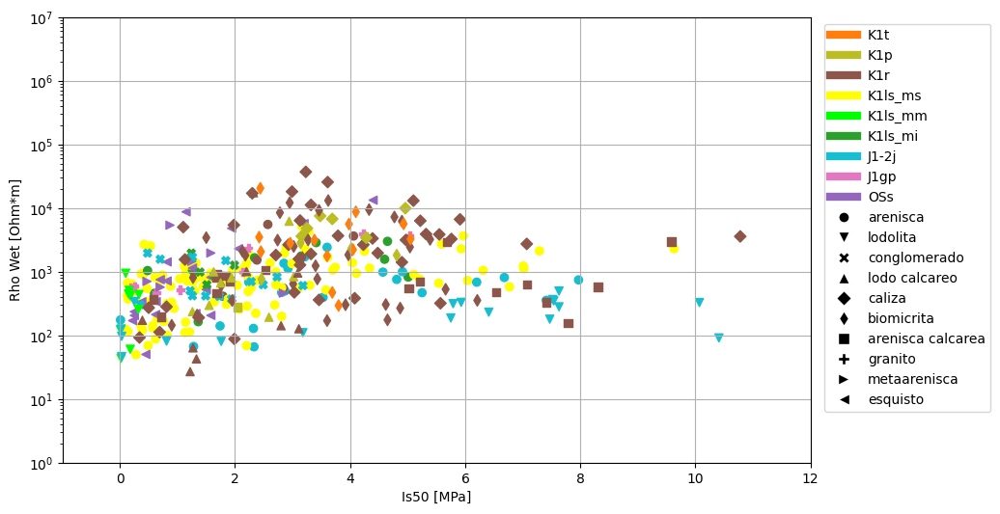

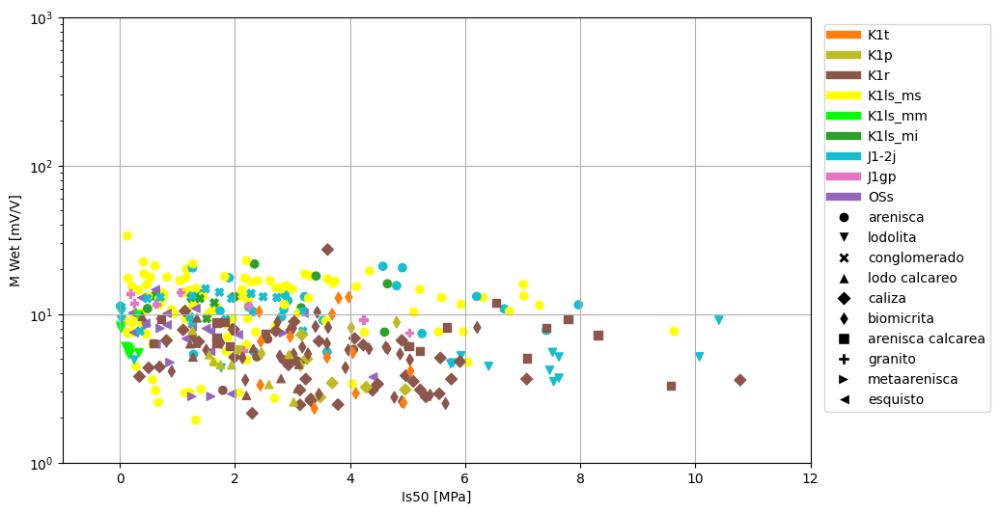

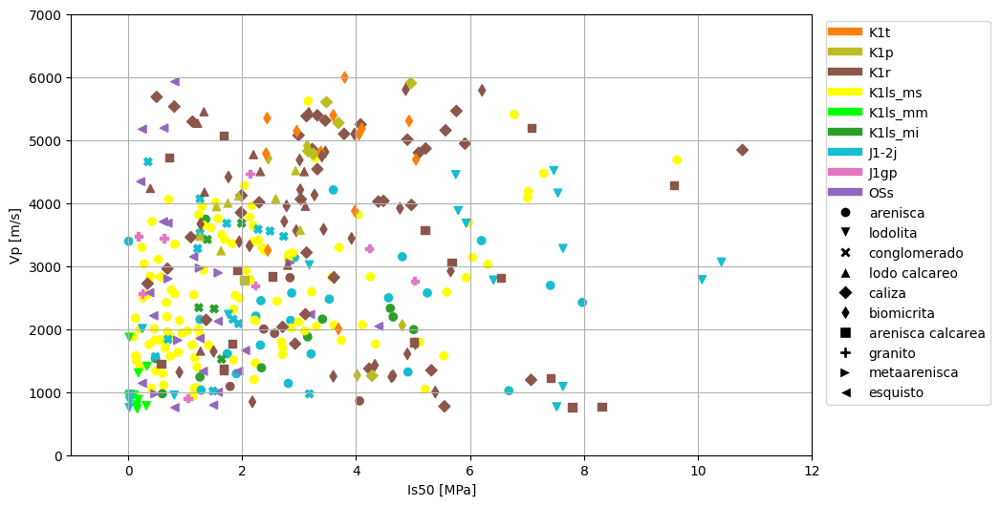

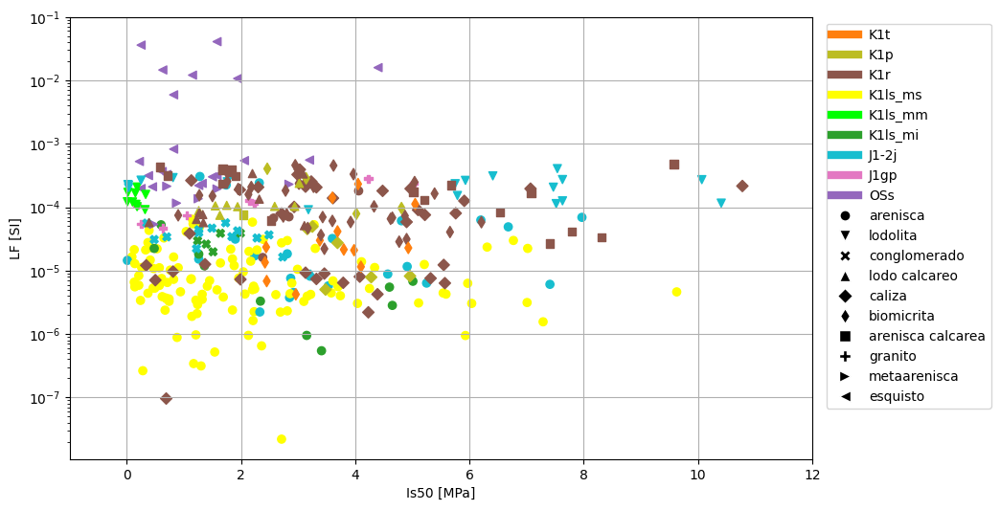

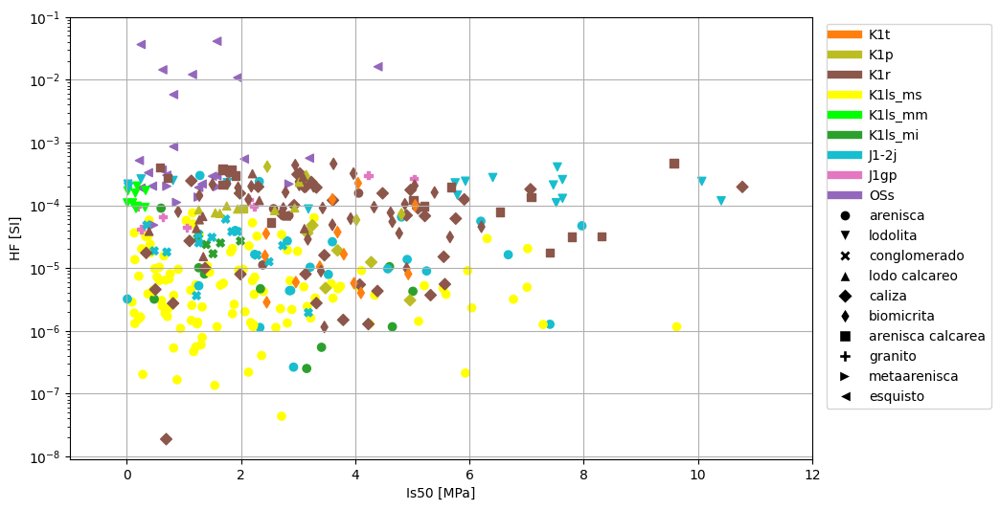

<ipython-input-10-6e6a645ec4df>:48: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim(lim_LF)


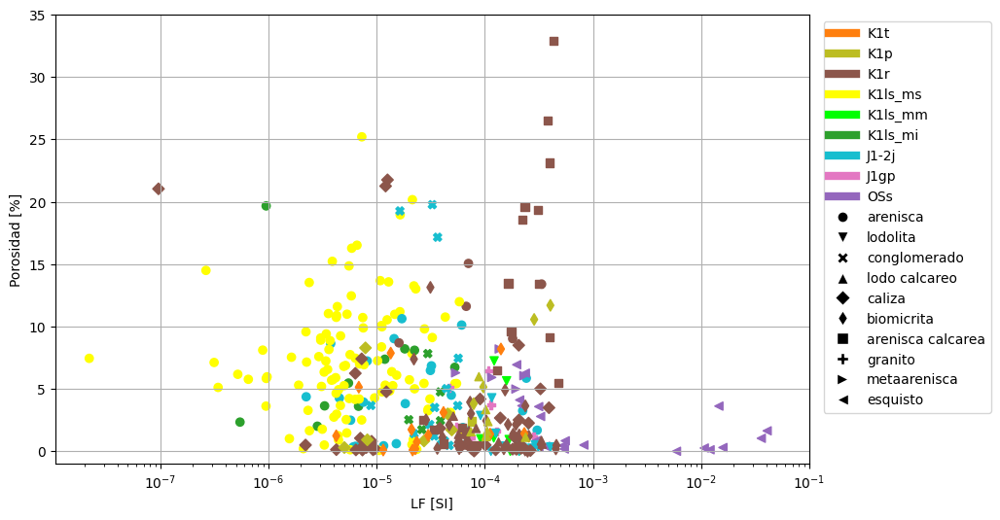

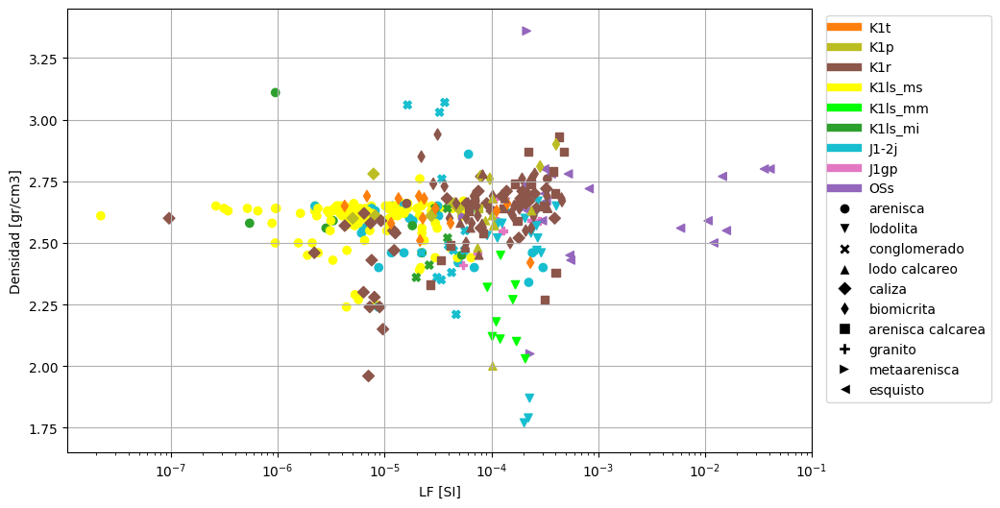

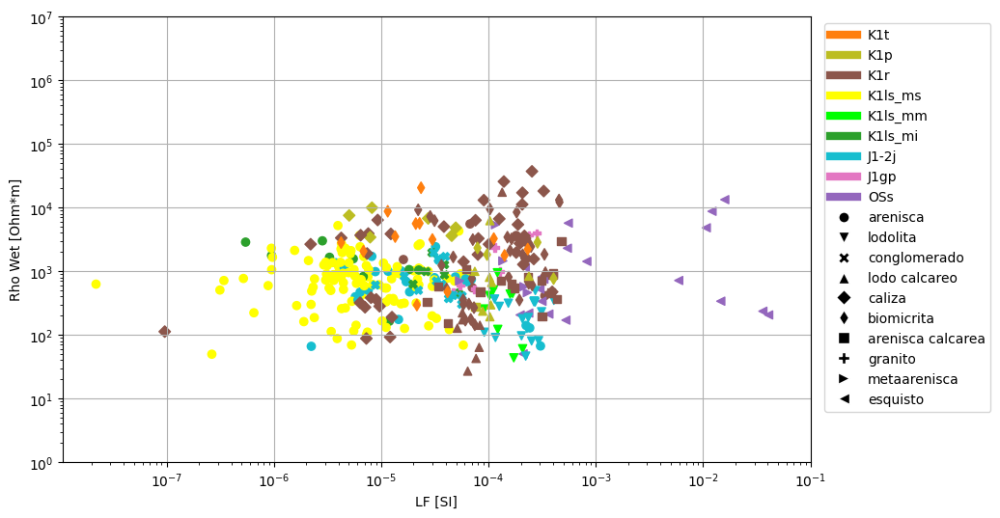

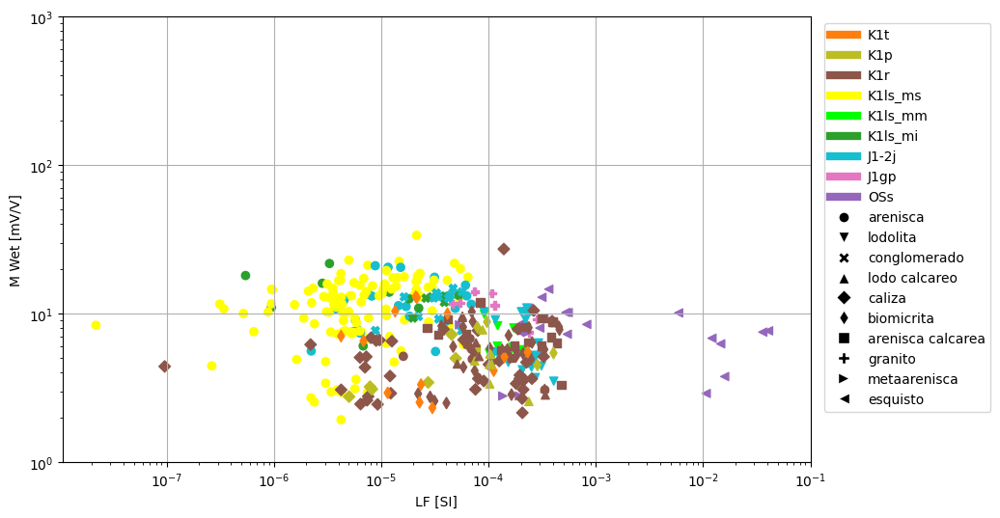

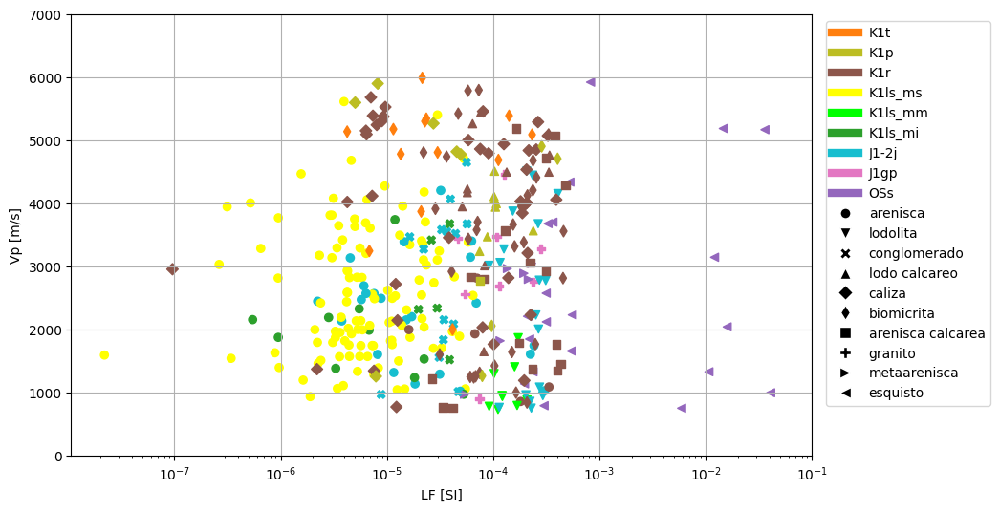

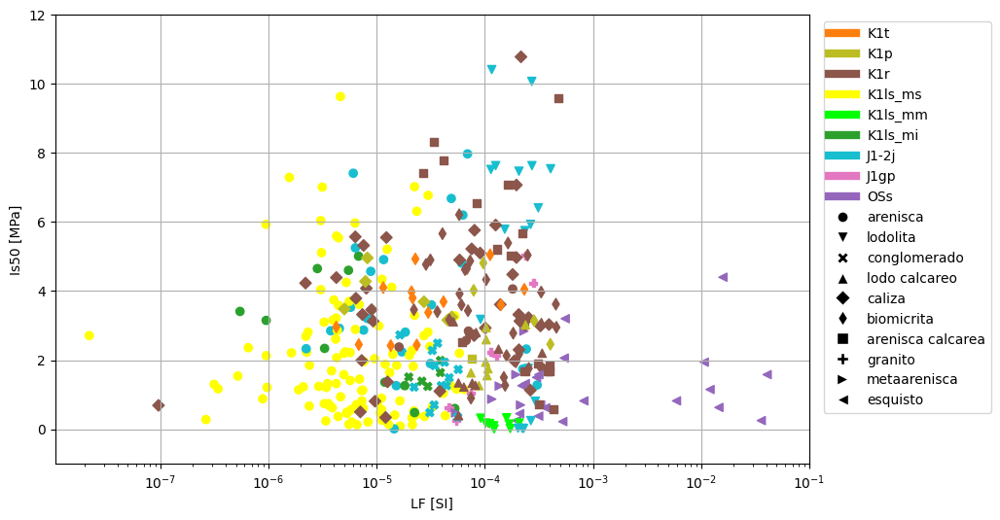

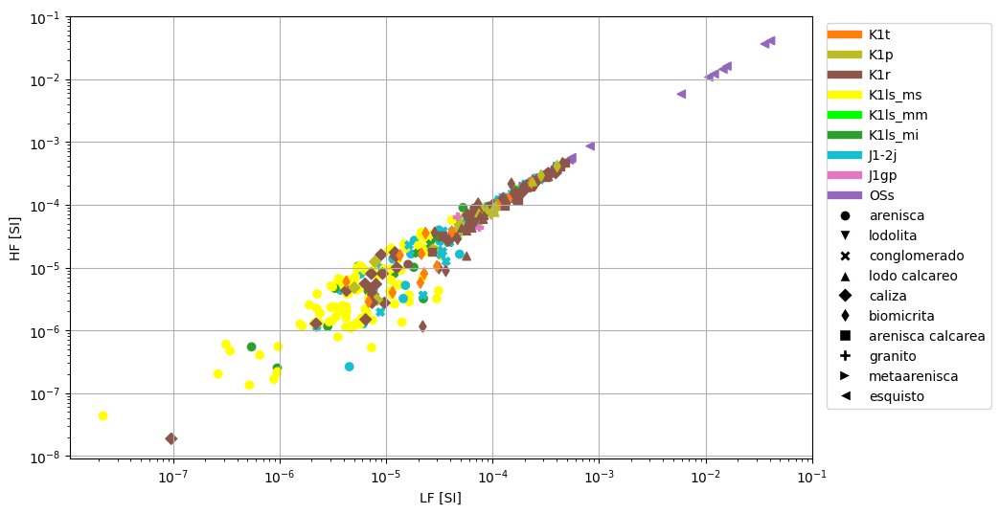

<ipython-input-10-6e6a645ec4df>:51: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim(lim_HF)


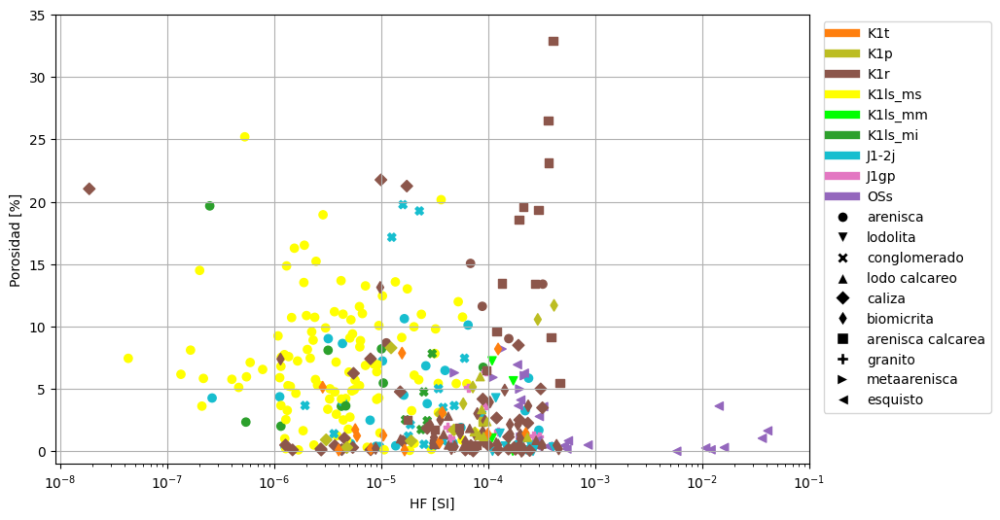

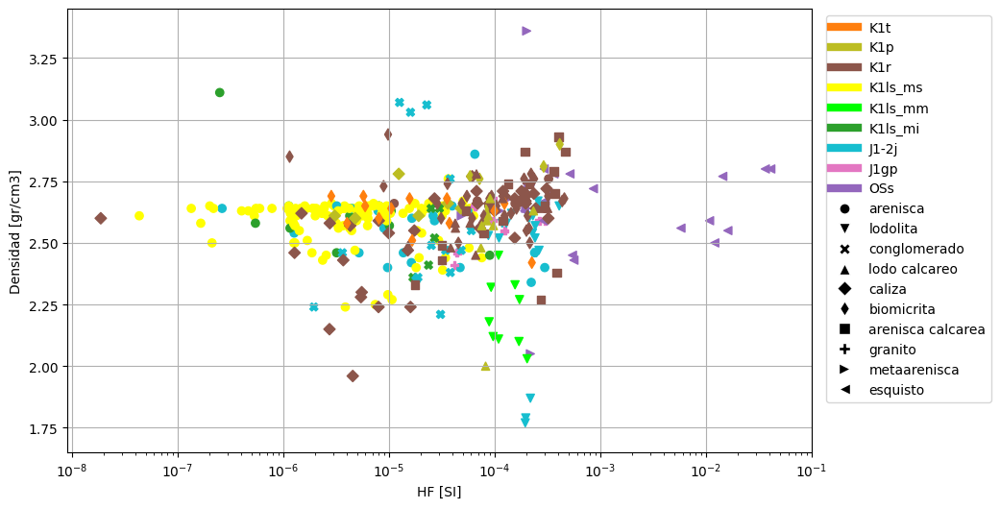

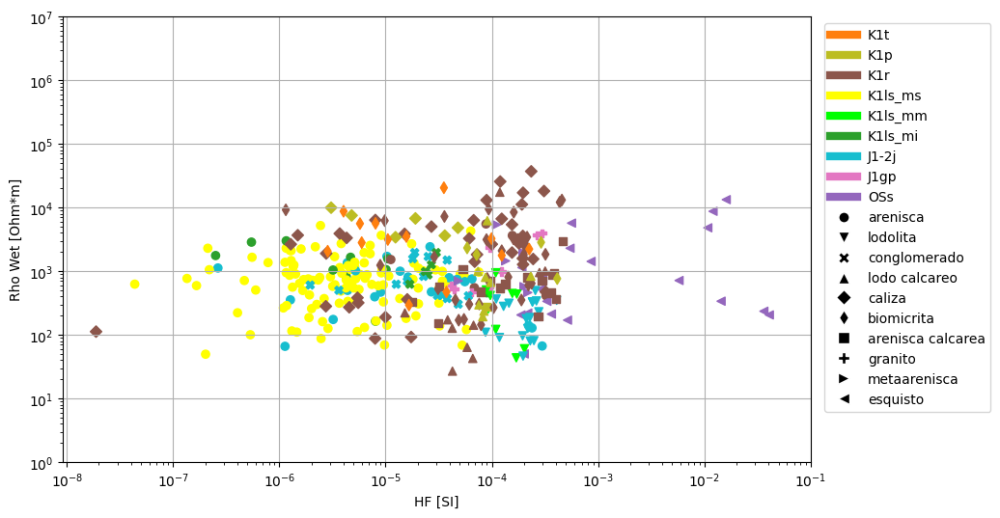

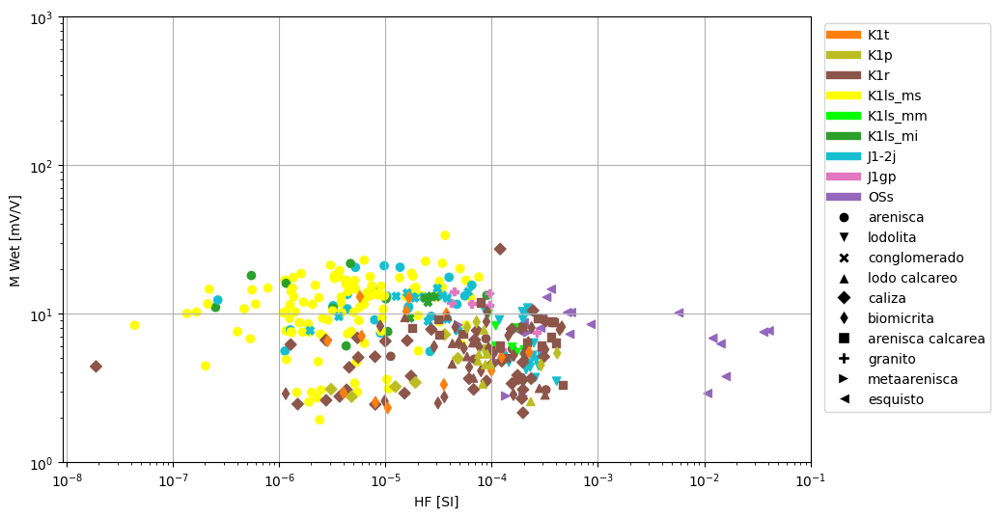

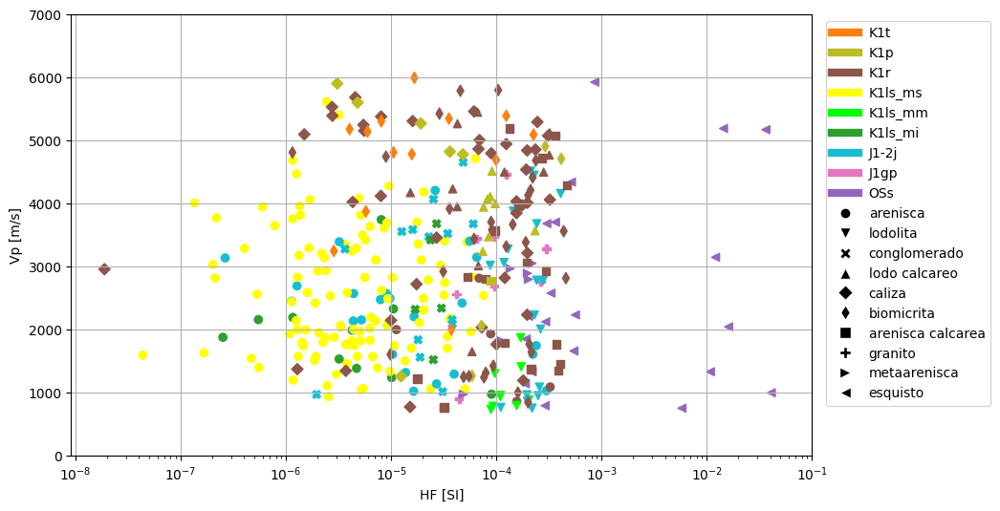

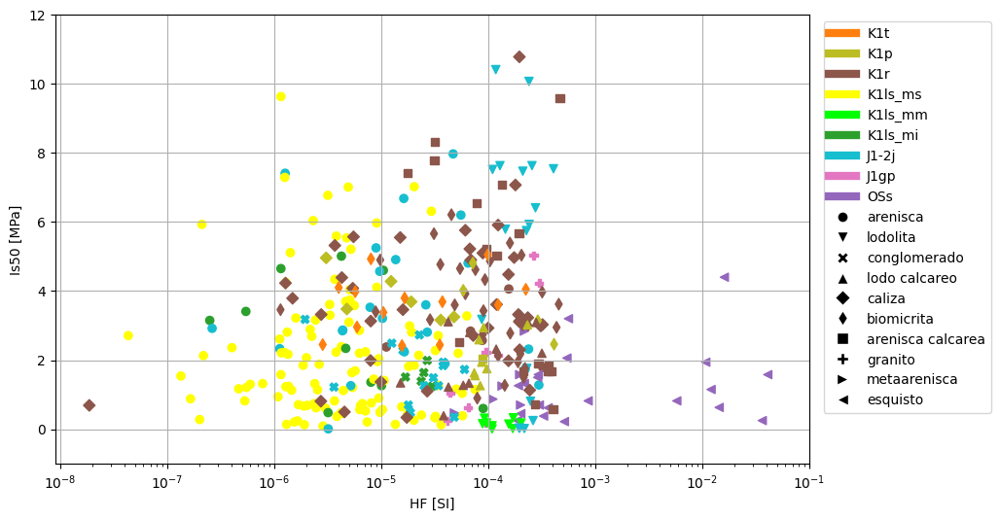

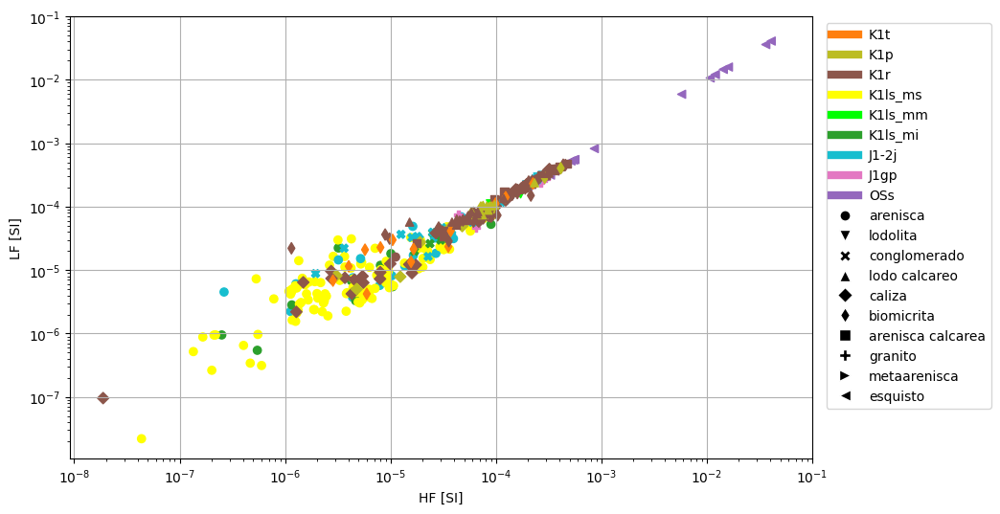

In [10]:
for k in propiedadesPlugs:
  for j in propiedadesPlugs:
    if k != j:
      plt.figure(figsize=(10,6))
      for i in simbol_unicos:
        simbol = i
        filtro = plugs['Simbolo'] ==  simbol
        plt.scatter(plugs[k][filtro], plugs[j][filtro],
                    c=plugs['Color'][filtro], marker=simbol)
      #limites para eje Y
      if j == 'Porosidad [%]':
        plt.ylim(lim_Porosidad)
      if j == 'Densidad [gr/cm3]':
        plt.ylim(lim_Densidad)
      if j == 'Rho Wet [Ohm*m]':
        plt.yscale('log')
        plt.ylim(lim_RhoWet)
      if j =='M Wet [mV/V]':
        plt.yscale('log')
        plt.ylim(lim_MWet)
      if j =='Vp [m/s]':
        plt.ylim(lim_Vp)
      if j == 'Is50 [MPa]':
        plt.ylim(lim_Is50)
      if j == 'LF [SI]':
        plt.yscale('log')
        plt.ylim(lim_LF)
      if j == 'HF [SI]':
        plt.yscale('log')
        plt.ylim(lim_HF)
      #limites eje X
      if k == 'Porosidad [%]':
        plt.xlim(lim_Porosidad)
      if k == 'Densidad [gr/cm3]':
        plt.xlim(lim_Densidad)
      if k == 'Rho Wet [Ohm*m]':
        plt.xscale('log')
        plt.xlim(lim_RhoWet)
      if k =='M Wet [mV/V]':
        plt.xscale('log')
        plt.xlim(lim_MWet)
      if k =='Vp [m/s]':
        plt.xlim(lim_Vp)
      if k == 'Is50 [MPa]':
        plt.xlim(lim_Is50)
      if k == 'LF [SI]':
        plt.xscale('log')
        plt.xlim(lim_LF)
      if k == 'HF [SI]':
        plt.xscale('log')
        plt.xlim(lim_HF)

      plt.xlabel(k)
      plt.ylabel(j)
      plt.grid()
      plt.legend(custom_lines + custom_simbol, labels_unidad + labels_simbol, bbox_to_anchor=(1.25, 1))

      plt.show()
      print('\n')


# Estandarizar

Para llevar a cabo la estandarización de los datos necesarios para el PCA, utilizaremos la clase [`StandardScaler`](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html) de la biblioteca `Scikit-Learn`.

In [11]:
plugs.columns

Index(['Muestra', 'Unidad', 'Litologia', 'Porosidad [%]', 'Densidad [gr/cm3]',
       'Rho Wet [Ohm*m]', 'M Wet [mV/V]', 'Vp [m/s]', 'Is50 [MPa]', 'LF [SI]',
       'HF [SI]', 'Color', 'Simbolo'],
      dtype='object')

In [12]:
X = df[['Porosidad [%]','Densidad [gr/cm3]', 'Rho Wet [Ohm*m]',
        'M Wet [mV/V]', 'Vp [m/s]', 'Is50 [MPa]',
        'LF [SI]', 'HF [SI]']].copy()
X.head() # las columnas a ajustar

,Porosidad [%],Densidad [gr/cm3],Rho Wet [Ohm*m],M Wet [mV/V],Vp [m/s],Is50 [MPa],LF [SI],HF [SI]
0,10.98,2.66,916.49,22.49,1059.0,0.41,0.000015,0.000024
1,9.89,2.65,816.88,21.16,1294.0,0.61,0.000008,0.000003
2,7.84,2.61,315.44,14.52,2550.0,0.33,0.000021,0.000032
3,7.24,2.64,497.95,7.52,3297.0,0.24,0.000003,0.000002
4,20.17,2.76,662.24,33.65,2175.0,0.13,0.000021,0.000036


In [13]:
scaler = StandardScaler()
scaler.fit(X)

StandardScaler()

In [14]:
X_scaled = scaler.transform(X)
X_scaled.shape

(358, 8)

¿Cómo cambiarían los resultados si se aplica otro tipo de transformación a los datos para normalizarlos, o si no se aplica ninguna transformación? ¿Los resultados del PCA cambian?

In [15]:
np.round(X_scaled, 2)

array([[ 1.16,  0.44, -0.28, ..., -1.1 , -0.14, -0.14],
       [ 0.95,  0.38, -0.3 , ..., -1.  , -0.15, -0.14],
       [ 0.56,  0.15, -0.44, ..., -1.13, -0.14, -0.14],
       ...,
       [-0.85, -1.93, -0.36, ..., -1.19, -0.14, -0.14],
       [-0.74, -0.66, -0.35, ...,  1.33, -0.15, -0.14],
       [-0.89, -1.82, -0.3 , ..., -0.62, -0.15, -0.14]])

# PCA

Para realizar el Principal Component Analysis (PCA), utilizaremos la clase [`PCA`](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html#sklearn.decomposition.PCA) de la biblioteca `Scikit-Learn`.

Simplificaremos la configuración ajustando únicamente el siguiente parámetro:

- `n_components`: el número de componentes a mantener o el nuevo número de dimensiones que tendrán nuestros datos.


In [16]:
componentes = 8 # establecer la cantidad componentes nuevos
# Como los originales son 8, dejaremos el mismo valor para ver cómo se comporta
# y luego decidir cuales tomar
pca = PCA(n_components = componentes)

In [17]:
X_pca = pca.fit_transform(X_scaled) # ajustar y transformar de una vez

In [18]:
X_pca.shape

(358, 8)

In [19]:
np.round(X_pca, 2) # Los datos transformados en los nuevos vectores o componentes

array([[-0.91, -2.65,  0.94, ...,  0.05, -0.04, -0.  ],
       [-0.84, -2.37,  0.78, ..., -0.02,  0.02,  0.  ],
       [-0.53, -1.43,  0.47, ..., -0.5 ,  0.18, -0.  ],
       ...,
       [-0.74, -1.72, -2.08, ...,  0.01, -0.02, -0.  ],
       [-0.27,  0.35, -1.23, ...,  0.83, -0.12, -0.  ],
       [-0.3 , -0.3 , -2.04, ...,  0.62,  0.08, -0.  ]])

## Varianza Explicada

In [20]:
exp_var_pca = pca.explained_variance_ratio_
np.round(exp_var_pca, 2) # Que tanto explica cada componente nuevo el comportamiento de los datos

array([0.26, 0.22, 0.17, 0.11, 0.1 , 0.09, 0.05, 0.  ])

In [21]:
cum_sum_var = np.cumsum(exp_var_pca) # la sumatoria debe dar 1
# Siempre y cuando n_components sea igual a la cantidad de vectores originales
cum_sum_var

array([0.25649245, 0.47556016, 0.64636663, 0.75572882, 0.8586646 ,
       0.94868841, 0.99999623, 1.        ])

## Valores Singulares

In [22]:
# valores singulares considerando SVD ... pero para algo más cotidiano
# asumalos como los "auto-valores"
np.round(pca.singular_values_, 2)

array([27.1 , 25.05, 22.12, 17.7 , 17.17, 16.06, 12.12,  0.1 ])

In [23]:
np.round(pca.components_, 2) # los "auto-vectores"

array([[-0.12,  0.13,  0.14, -0.15,  0.11,  0.03,  0.68,  0.68],
       [-0.32,  0.13,  0.42, -0.38,  0.5 ,  0.5 , -0.18, -0.18],
       [ 0.65,  0.73,  0.14,  0.01,  0.15, -0.06, -0.03, -0.03],
       [-0.21,  0.02,  0.61,  0.74,  0.08, -0.16, -0.01, -0.01],
       [ 0.11, -0.27,  0.35, -0.44,  0.22, -0.74, -0.05, -0.05],
       [ 0.07,  0.02,  0.51, -0.27, -0.79,  0.18, -0.01, -0.01],
       [-0.64,  0.6 , -0.17, -0.11, -0.19, -0.38, -0.09, -0.09],
       [ 0.  , -0.  ,  0.  ,  0.  , -0.  ,  0.  ,  0.71, -0.71]])

In [24]:
np.linalg.norm(pca.components_, axis=1) # la norma de cada auto-vector debe ser 1
# ya que todos son vectores unitarios y el auto-valor si establece su magnitud

array([1., 1., 1., 1., 1., 1., 1., 1.])

In [25]:
pca.components_.shape

(8, 8)

## Gráfica de Varianza Explicada

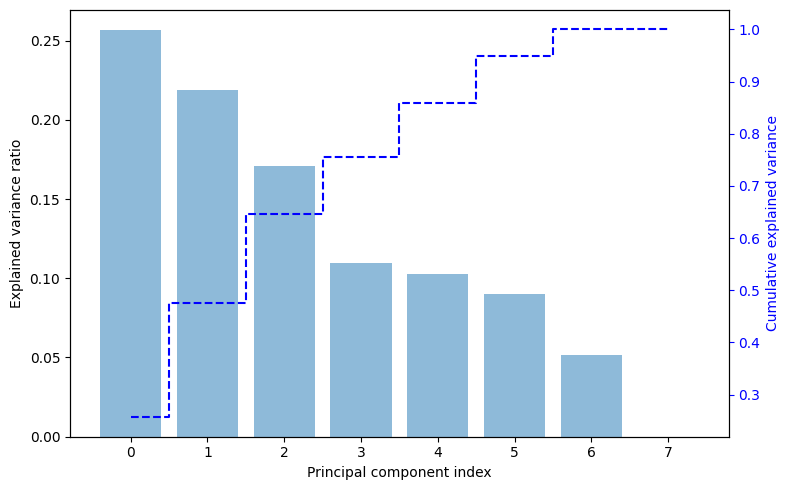

In [26]:
fig, ax1 = plt.subplots(figsize=(8,5))

ax2 = ax1.twinx()

ax1.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center')
ax1.set_ylabel('Explained variance ratio')
ax1.set_xlabel('Principal component index')
#ax1.set_yscale('log')

ax2.step(range(0,len(cum_sum_var)), cum_sum_var, where='mid', c='b', ls='--')
ax2.set_ylabel('Cumulative explained variance', c='b')
ax2.tick_params(axis='y', colors='b')

plt.tight_layout()

plt.show()

## Graficos VS componentes nuevos

In [27]:
plugs.columns

Index(['Muestra', 'Unidad', 'Litologia', 'Porosidad [%]', 'Densidad [gr/cm3]',
       'Rho Wet [Ohm*m]', 'M Wet [mV/V]', 'Vp [m/s]', 'Is50 [MPa]', 'LF [SI]',
       'HF [SI]', 'Color', 'Simbolo'],
      dtype='object')

In [28]:
plugs.shape

(358, 13)

In [29]:
X_pca.shape

(358, 8)

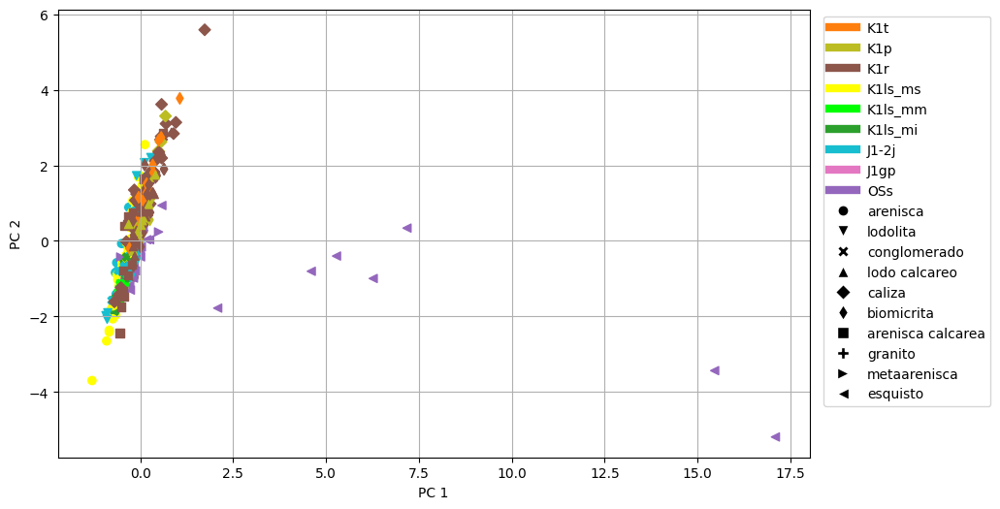

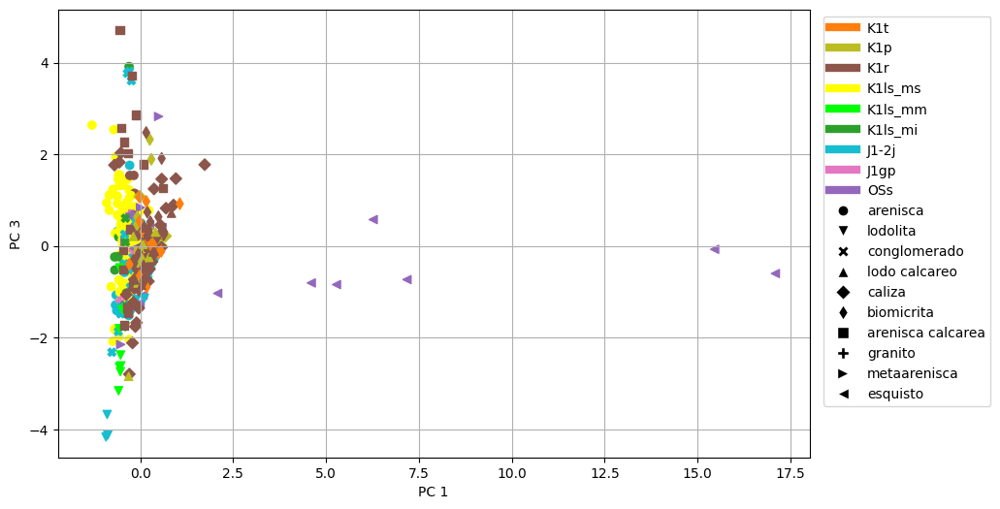

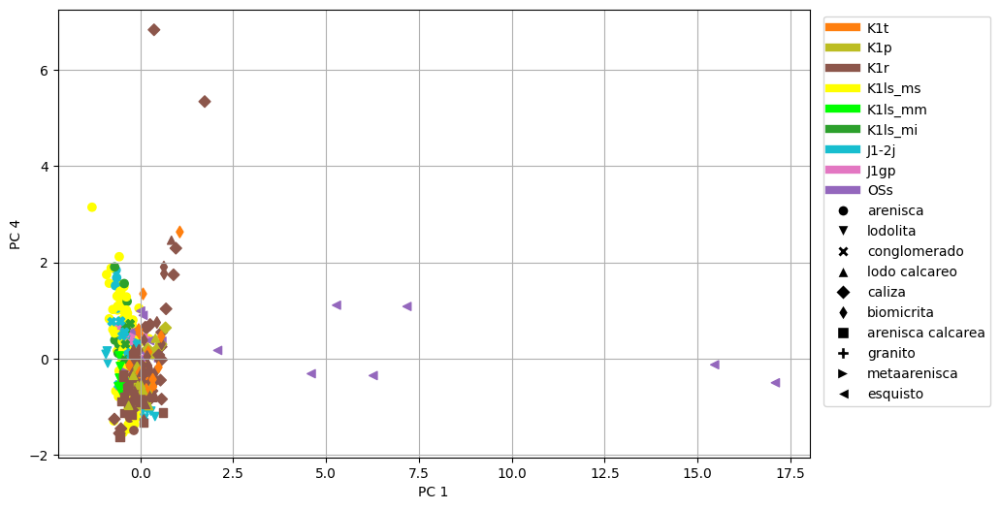

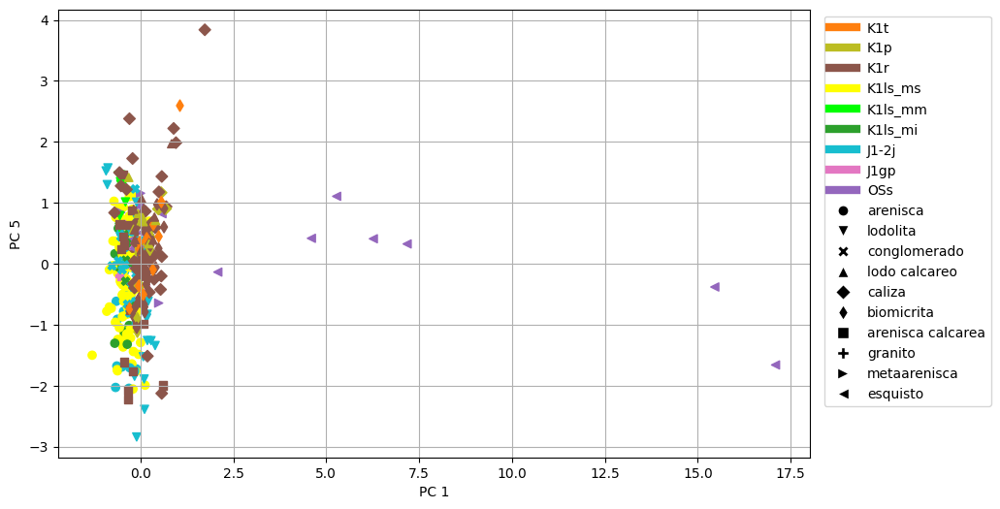

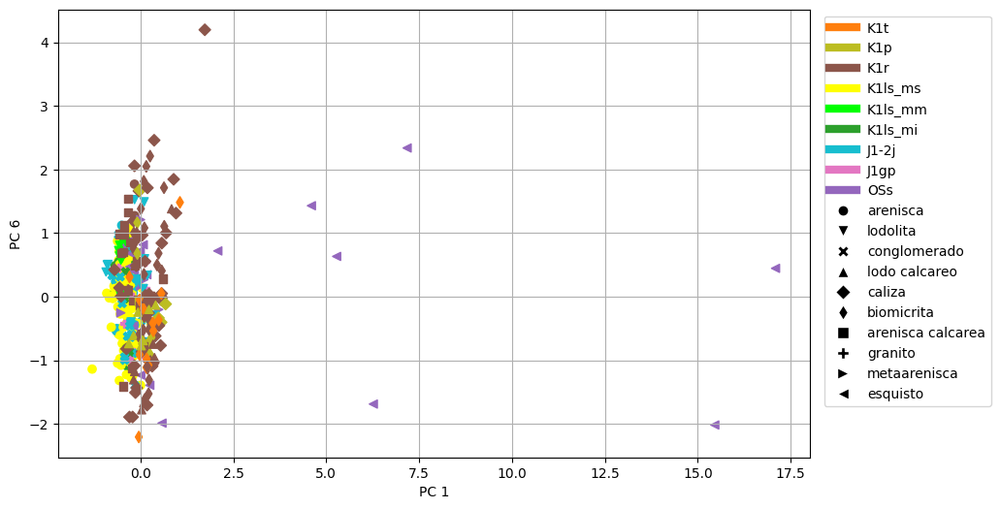

...

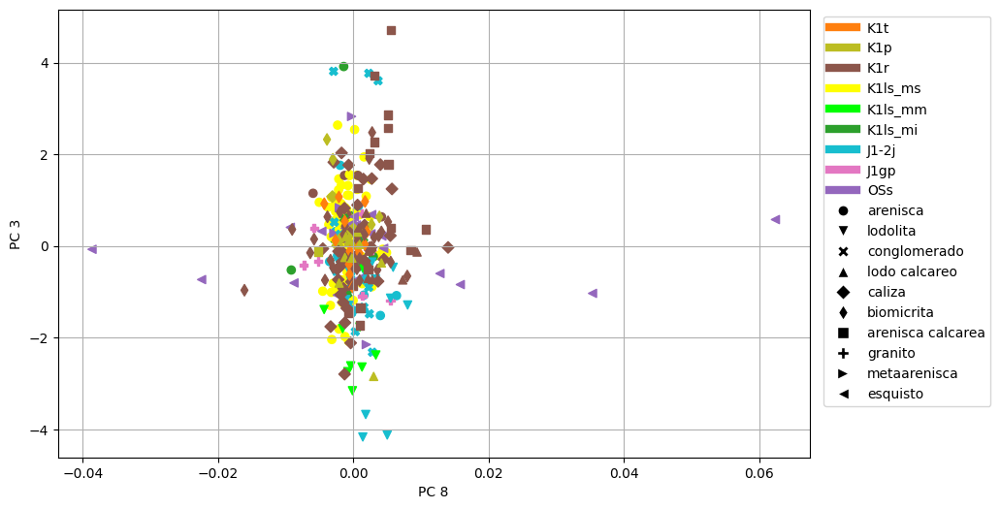

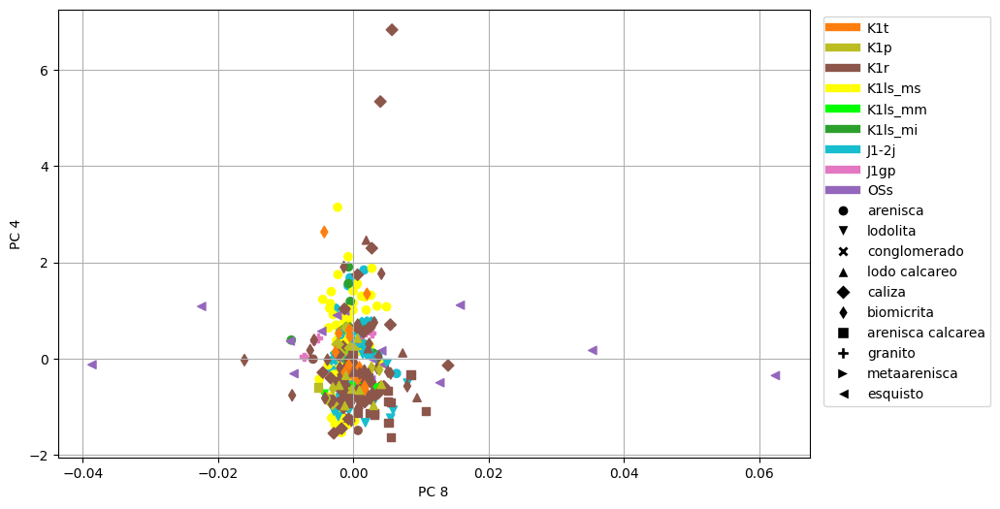

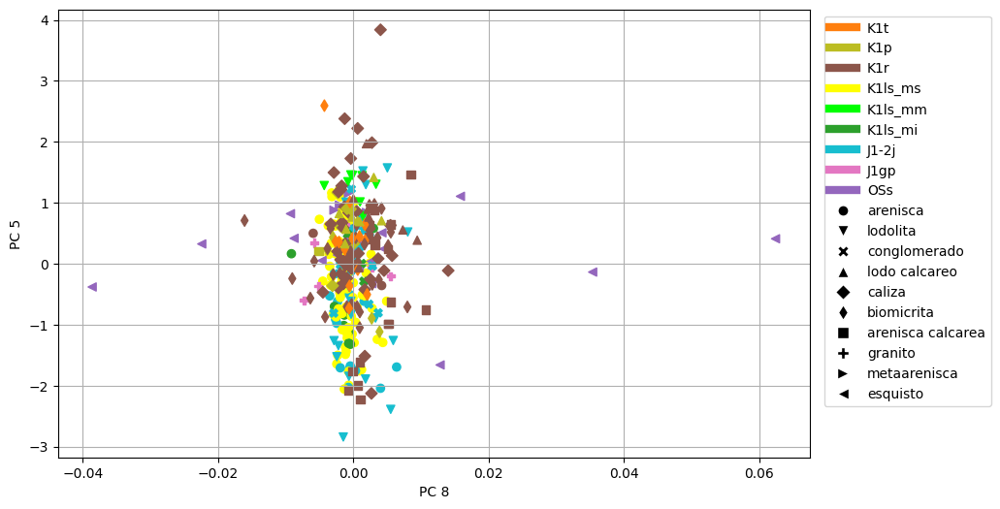

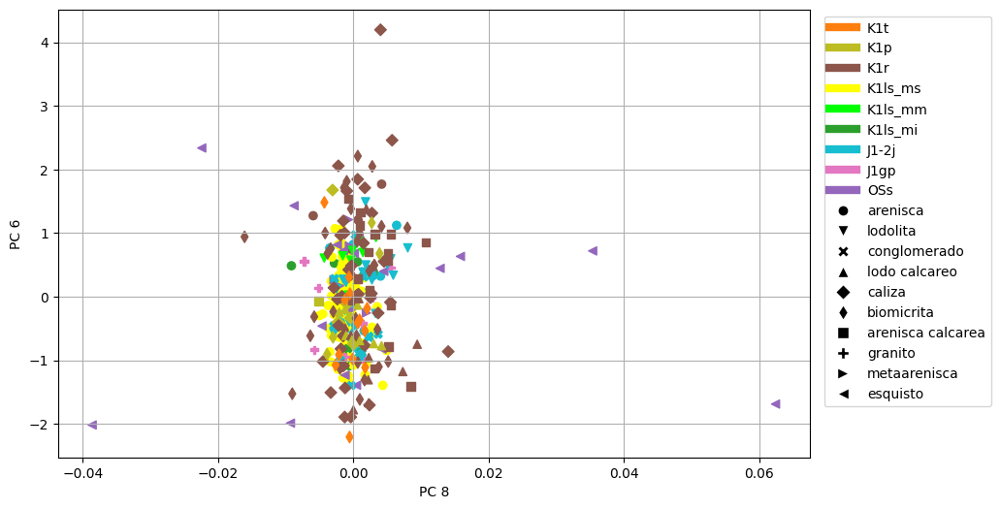

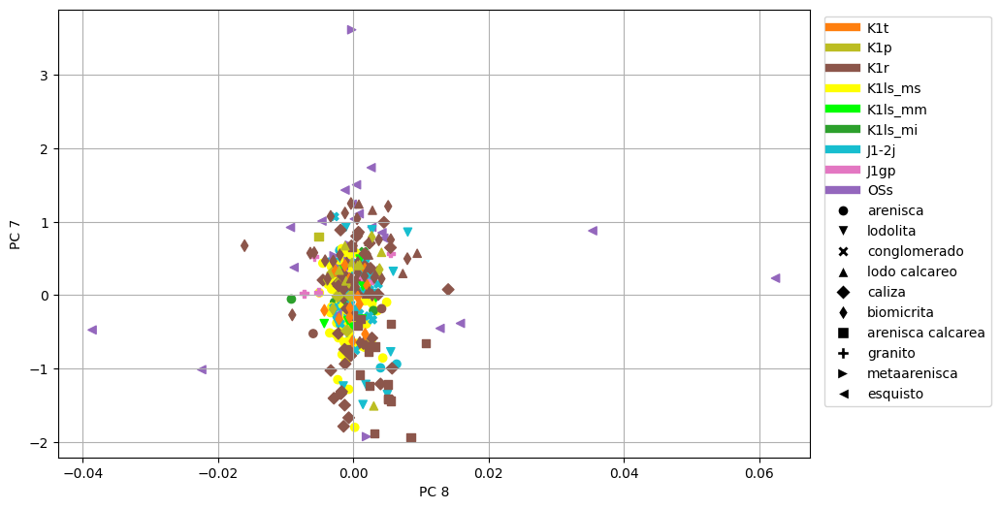

In [30]:
for j in range(componentes):
  for k in range(componentes):
    if j != k:
      plt.figure(figsize=(10,6))
      for i in simbol_unicos:
        simbol = i
        filtro = plugs['Simbolo'] ==  simbol
        plt.scatter(X_pca[:, j][filtro], X_pca[:, k][filtro],
                    c=plugs['Color'][filtro], marker=simbol)
      plt.xlabel(f'PC {j+1}')
      plt.ylabel(f'PC {k+1}')
      plt.grid()
      plt.legend(custom_lines + custom_simbol, labels_unidad + labels_simbol, bbox_to_anchor=(1.25, 1))

      plt.show()
      print('\n')

Como habrán notado, los resultados parecen poco favorables para la diferenciación entre los tipos de rocas o formaciones. Solo se identifican algunas muestras asociadas a esquistos, lo que sugiere o confirma que quizás no se realizó un Análisis Exploratorio de Datos (EDA) a fondo. Aunque es arriesgado asumir la posible influencia de los datos de entrada, los diagramas de caja pueden proporcionar algunas pistas sobre esta litología.

> *Observación:* Analizando los autovectores, es posible comprender cómo contribuyó cada componente principal a los nuevos componentes. Esta interpretación es válida únicamente si los datos están escalados o estandarizados, de manera que las magnitudes de los valores sean comparables.

# Boxplot

Aunque no se realizó un Análisis Exploratorio de Datos, generaremos algunos diagramas de caja y bigotes (boxplots) para observar posibles patrones y anomalías en los datos. Además, realizaremos gráficos de enjambres junto con los boxplots para visualizar mejor la distribución.

<ipython-input-31-4ad44b46c528>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sn.boxplot(x='Unidad', y=i, data=plugs,
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 16.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


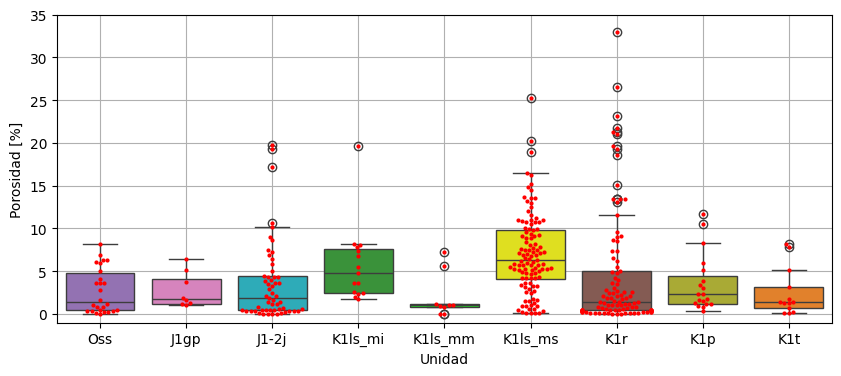

<ipython-input-31-4ad44b46c528>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sn.boxplot(x='Unidad', y=i, data=plugs,
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 38.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 34.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


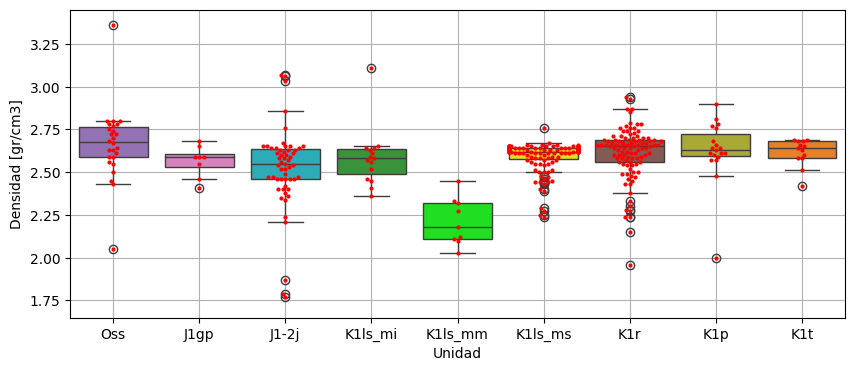

<ipython-input-31-4ad44b46c528>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sn.boxplot(x='Unidad', y=i, data=plugs,
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 34.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 46.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 18.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


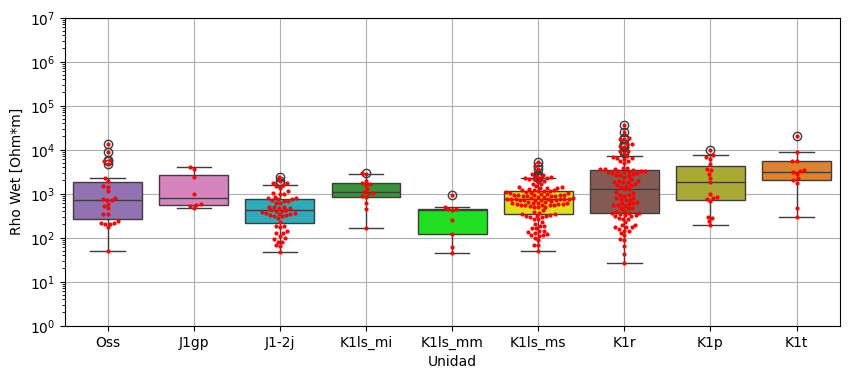

<ipython-input-31-4ad44b46c528>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sn.boxplot(x='Unidad', y=i, data=plugs,


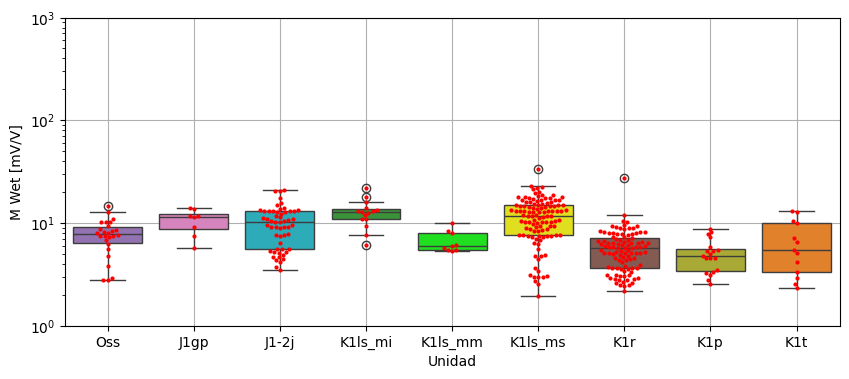

<ipython-input-31-4ad44b46c528>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sn.boxplot(x='Unidad', y=i, data=plugs,


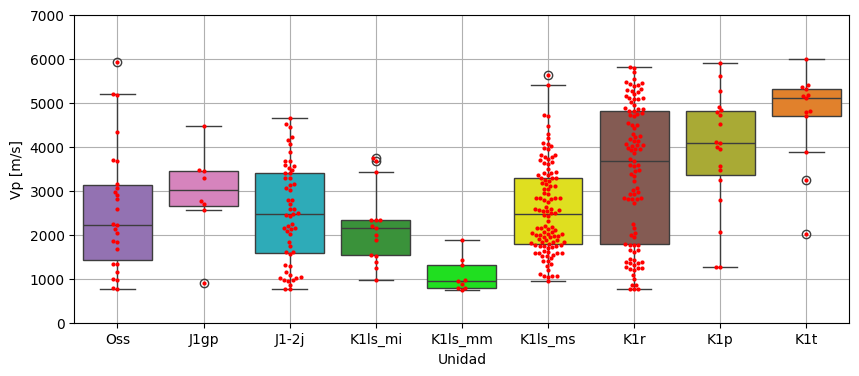

<ipython-input-31-4ad44b46c528>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sn.boxplot(x='Unidad', y=i, data=plugs,


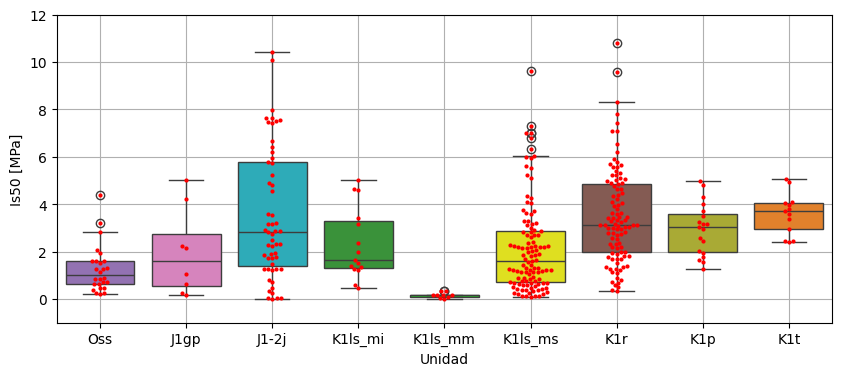

<ipython-input-31-4ad44b46c528>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sn.boxplot(x='Unidad', y=i, data=plugs,
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 11.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 72.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 86.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: Use

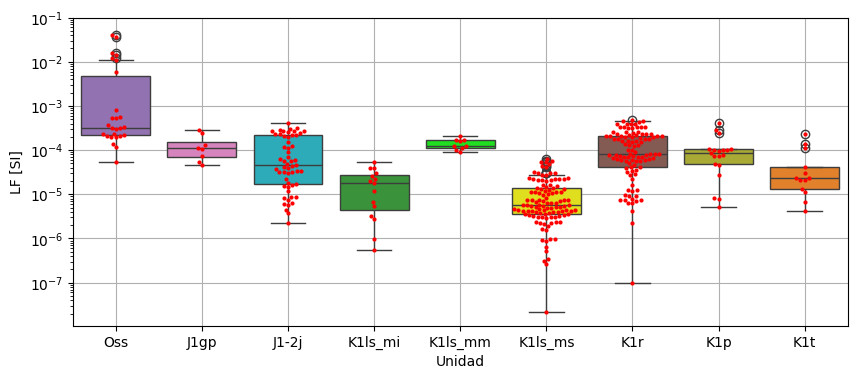

<ipython-input-31-4ad44b46c528>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sn.boxplot(x='Unidad', y=i, data=plugs,
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 11.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 72.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 86.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: Use

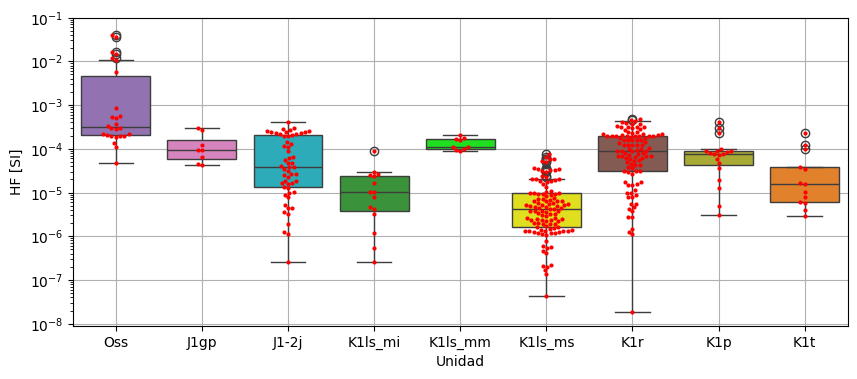

In [31]:
#boxplots por Unidad

for i in propiedadesPlugs:
  plt.figure(figsize=(10,4))
  ax = sn.boxplot(x='Unidad', y=i, data=plugs,
                  palette = colores_unidad,
                  order=ordenUnidades)
  ax = sn.swarmplot(x='Unidad', y=i,  data=plugs, color='r', size=3.0,
                    order=ordenUnidades)
  plt.ylabel(('{}').format(i))
  if i == 'Porosidad [%]':
    plt.ylim(lim_Porosidad)
  if i == 'Densidad [gr/cm3]':
    plt.ylim(lim_Densidad)
  if i == 'Rho Wet [Ohm*m]':
    plt.yscale('log')
    plt.ylim(lim_RhoWet)
  if i =='M Wet [mV/V]':
    plt.yscale('log')
    plt.ylim(lim_MWet)
  if i =='Vp [m/s]':
    plt.ylim(lim_Vp)
  if i == 'Is50 [MPa]':
    plt.ylim(lim_Is50)
  if i == 'LF [SI]':
    plt.yscale('log')
    plt.ylim(lim_LF)
  if i == 'HF [SI]':
    plt.yscale('log')
    plt.ylim(lim_HF)

  plt.grid()
  plt.show()
  print('\n')

# Conclusiones
- **Reducción de Dimensionalidad:** El PCA es una herramienta útil para reducir la dimensionalidad de los datos; simplificando y facilitando la visualización y análisis.
- **Retención de Variabilidad:** Al proyectar los datos en menos dimensiones, el PCA busca conservar la mayor varianza o variabilidad original.
- **Identificación de Patrones:** El PCA ayuda a identificar patrones subyacentes en los datos, lo que puede ser útil para la clasificación, detección de anomalías y otras tareas analíticas.
- **Interpretabilidad:** Los nuevos componentes principales generados por el PCA pueden ser difíciles de interpretar.
- **Dependencia de la Escalabilidad:** La efectividad del PCA depende de la estandarización de los datos. Si los datos no están correctamente estandarizados, los resultados pueden ser sesgados. Adicionalmente, al buscar conservar la varianza, es importante recordar que la varianza es susceptible a valores atípicos, por lo que el PCA también está afectado por la presencia de estos valores.

## Consideraciones
- ** Preprocesamiento:** Realizar un Análisis Exploratorio de Datos (EDA) antes de aplicar el PCA es recomendable. Esto ayuda a identificar y manejar outliers, distribuciones y relaciones entre variables que pueden afectar los resultados del PCA. Posterior al EDA, es recomendable proceder con una estandarización adecuada de los datos para evitar que algunas variables, propiedades, características o features puedan afectar negativamente los resultados.
- **Selección de Componentes:** Determinar el número adecuado de componentes principales (`n_components`) se puede lograr mediante el análisis de la varianza explicada por cada componente.
- **Complementariedad:** Aunque el PCA es una herramienta poderosa, debe complementarse con otras técnicas de análisis y visualización para obtener una comprensión completa de los datos.

# Fin